In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [2]:
df = pd.read_excel(r"C:\Users\Aditya P J\Documents\Magang dan KKN\Magang\Proyek\data_cleanedbronze2_PGN.xlsx")
df.head()

,SBU,Kode Area,No Ref,Account Name,Sektor Industri,Periode,Terukur m3,Terukur mmbtu,Batas Min,Batas Max,segmentasi
0,SOR I,17,232992,"GRAND SARANA MANDIRI, PT",LAIN-LAIN (OTHERS),2023-01-01,10947.4475,390.5719,350,1750,Bronze 2
1,SOR I,17,232992,"GRAND SARANA MANDIRI, PT",LAIN-LAIN (OTHERS),2023-02-01,10856.5441,387.7854,350,1750,Bronze 2
2,SOR I,17,232992,"GRAND SARANA MANDIRI, PT",LAIN-LAIN (OTHERS),2023-03-01,13294.6098,472.5794,350,1750,Bronze 2
3,SOR I,17,232992,"GRAND SARANA MANDIRI, PT",LAIN-LAIN (OTHERS),2023-04-01,13508.0884,481.3496,350,1750,Bronze 2
4,SOR I,17,232992,"GRAND SARANA MANDIRI, PT",LAIN-LAIN (OTHERS),2023-05-01,14417.3913,516.1667,350,1750,Bronze 2


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22699 entries, 0 to 22698
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   SBU              22699 non-null  object        
 1   Kode Area        22699 non-null  int64         
 2   No Ref           22699 non-null  int64         
 3   Account Name     22699 non-null  object        
 4   Sektor Industri  22699 non-null  object        
 5   Periode          22699 non-null  datetime64[ns]
 6   Terukur m3       22699 non-null  float64       
 7   Terukur mmbtu    22699 non-null  float64       
 8   Batas Min        22699 non-null  int64         
 9   Batas Max        22699 non-null  int64         
 10  segmentasi       22699 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(4), object(4)
memory usage: 1.9+ MB


In [4]:
df.isnull().sum()

SBU                0
Kode Area          0
No Ref             0
Account Name       0
Sektor Industri    0
Periode            0
Terukur m3         0
Terukur mmbtu      0
Batas Min          0
Batas Max          0
segmentasi         0
dtype: int64

In [5]:
df[['Terukur m3', 'Terukur mmbtu', 'Batas Min', 'Batas Max']].describe()

,Terukur m3,Terukur mmbtu,Batas Min,Batas Max
count,22699.000000,22699.000000,22699.000000,22699.000000
mean,22088.721283,813.019784,349.667386,1917.327856
std,13104.692743,482.266912,6.017951,403.397585
min,4547.390000,175.156800,192.000000,960.000000
25%,11835.440000,436.591900,350.000000,1750.000000
50%,19119.720000,703.691300,350.000000,1750.000000
75%,29096.504250,1071.339750,350.000000,1750.000000
max,94865.653000,3484.547600,350.000000,3931.000000


In [6]:
df[['Terukur m3']].describe()

,Terukur m3
count,22699.000000
mean,22088.721283
std,13104.692743
min,4547.390000
25%,11835.440000
50%,19119.720000
75%,29096.504250
max,94865.653000


In [7]:
total = df

### 📊 Chart EDA (histplot kde, BOX Plot, Periode)

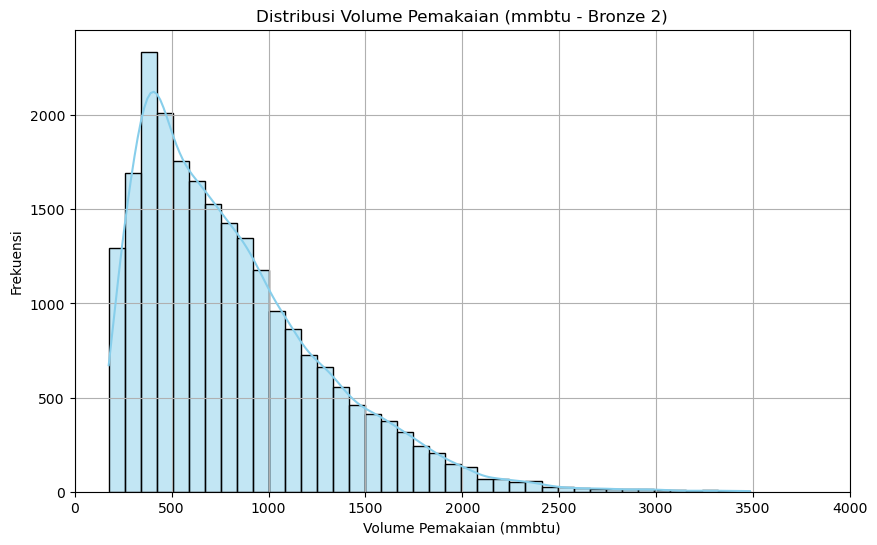

In [9]:
#Distribusi Volume Pemakaian

plt.figure(figsize=(10,6))
sns.histplot(df['Terukur mmbtu'], kde=True, bins=40, color='skyblue')
plt.title('Distribusi Volume Pemakaian (mmbtu - Bronze 2)')
plt.xlabel('Volume Pemakaian (mmbtu)')
plt.ylabel('Frekuensi')
plt.grid(True)
plt.xlim(0, 4000)
plt.show()

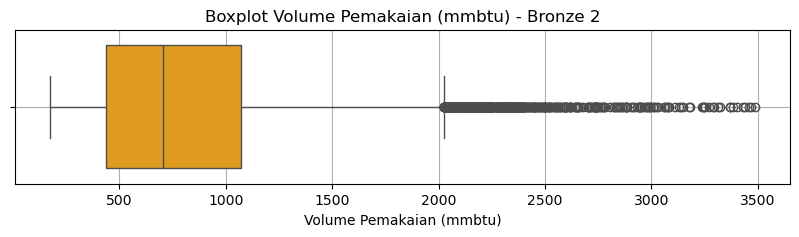

In [10]:
plt.figure(figsize=(10, 2))
sns.boxplot(x=df['Terukur mmbtu'], color='orange')
plt.title('Boxplot Volume Pemakaian (mmbtu) - Bronze 2')
plt.xlabel('Volume Pemakaian (mmbtu)')
plt.grid(True)
plt.show()


In [11]:
skew_val = df['Terukur mmbtu'].skew()
print(f'Skewness: {skew_val:.2f}')

print(df['Terukur mmbtu'].describe())

Skewness: 1.21
count    22699.000000
mean       813.019784
std        482.266912
min        175.156800
25%        436.591900
50%        703.691300
75%       1071.339750
max       3484.547600
Name: Terukur mmbtu, dtype: float64


<function matplotlib.pyplot.show(close=None, block=None)>

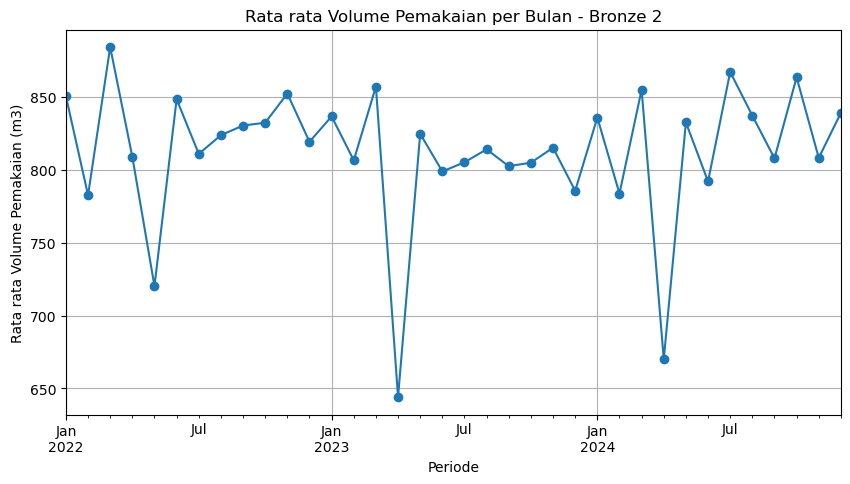

In [12]:
df['Periode'] = pd.to_datetime(df['Periode'])
monthly_avg = df.groupby(df['Periode'].dt.to_period('M'))['Terukur mmbtu'].mean()

monthly_avg.plot(kind='line', marker='o', figsize=(10,5))
plt.title('Rata rata Volume Pemakaian per Bulan - Bronze 2')
plt.xlabel('Periode')
plt.ylabel('Rata rata Volume Pemakaian (m3)')
plt.grid(True)
plt.show

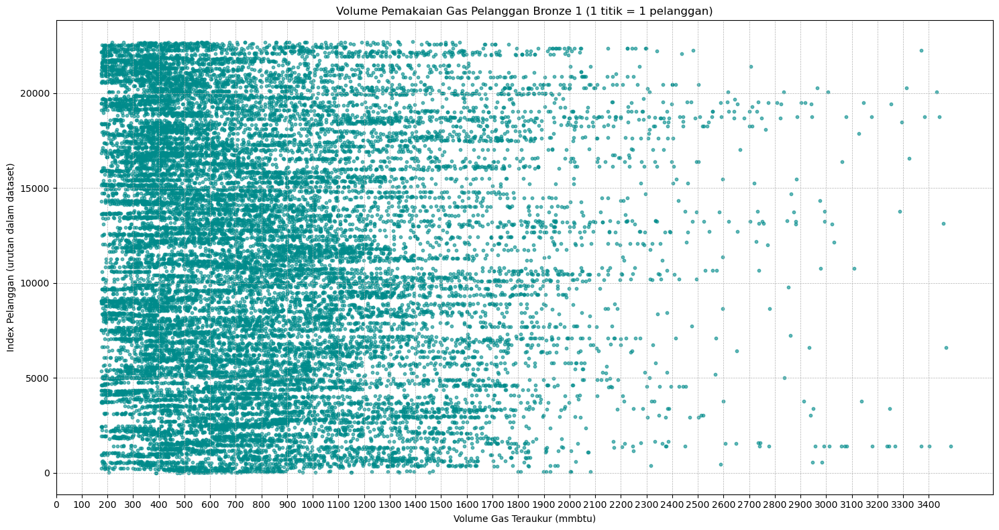

In [13]:
df = df.reset_index(drop=True)

# Scatter plot aktual (1 titik = 1 pelanggan)
plt.figure(figsize=(15, 8))
plt.scatter(df['Terukur mmbtu'], df.index, color='darkcyan', alpha=0.6, s=10)
plt.title('Volume Pemakaian Gas Pelanggan Bronze 1 (1 titik = 1 pelanggan)')
plt.xlabel('Volume Gas Teraukur (mmbtu)')
plt.ylabel('Index Pelanggan (urutan dalam dataset)')
plt.grid(True, linestyle='--', linewidth=0.5)
max_x = df['Terukur mmbtu'].max()
plt.xticks(np.arange(0, max_x, 100))
plt.tight_layout()
plt.show()

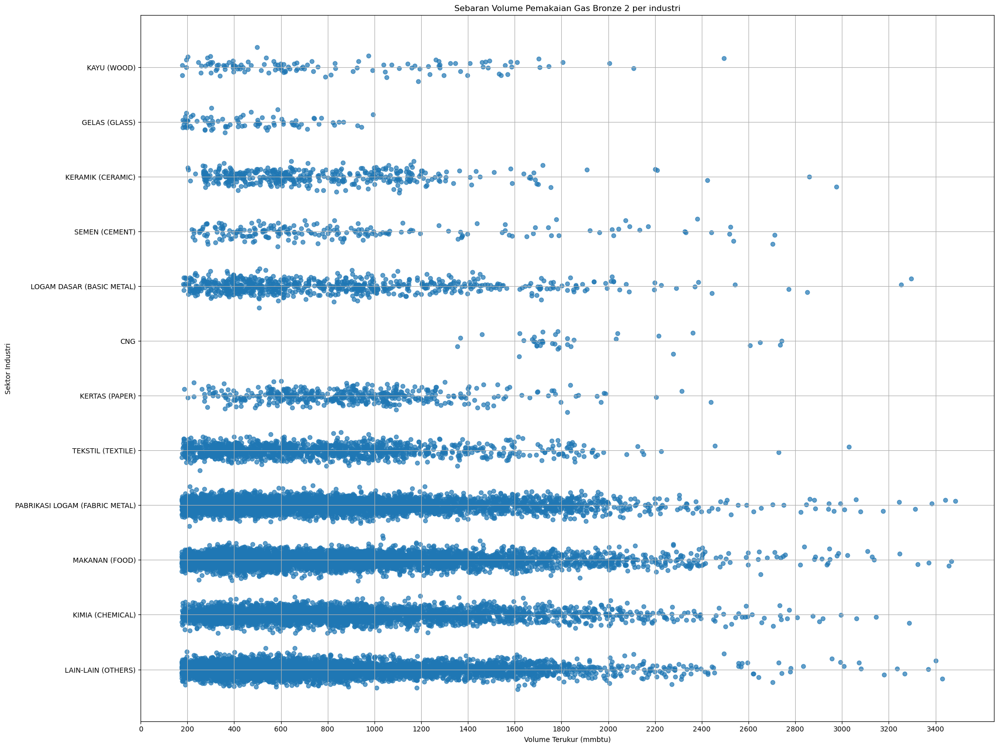

In [14]:
#mapping
sector_mapping = {sector:i for i, sector in enumerate(df['Sektor Industri'].unique())}
df['Y_code'] = df['Sektor Industri'].map(sector_mapping)

#efek jitter
np.random.seed(42)
df['Y_jittered'] = df['Y_code'] + np.random.normal(0, 0.1, size=len(df))

plt.figure(figsize=(20, 15))
plt.scatter(df['Terukur mmbtu'], df['Y_jittered'], alpha=0.7)
sorted_sectors = sorted(sector_mapping.items(), key = lambda x: x[1])
max_x = df['Terukur mmbtu'].max()
plt.xticks(np.arange(0, max_x, 200))
plt.yticks(
    ticks=[code for sector, code in sorted_sectors],
    labels=[sector for sector, code in sorted_sectors]
)
plt.xlabel('Volume Terukur (mmbtu)')
plt.ylabel('Sektor Industri')
plt.title('Sebaran Volume Pemakaian Gas Bronze 2 per industri')
plt.grid(True)
plt.tight_layout()
plt.show()

## 📈 Elbow Method

In [16]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

x = df[["Terukur m3"]].copy()

scaler = StandardScaler()
scaled = scaler.fit_transform(x)

inertia = []
for k in range(1, 10):
    km = KMeans(n_clusters=k, random_state=42, n_init='auto')
    km.fit(scaled)
    inertia.append(km.inertia_)

sse = km.inertia_
print(f"SSE (Sum of Squared Errors): {sse}")


SSE (Sum of Squared Errors): 530.5672254402066


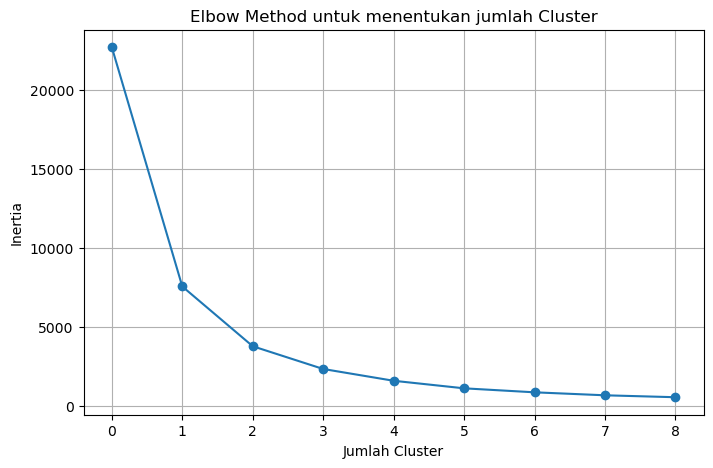

In [17]:
plt.figure(figsize=(8,5))
plt.plot(range(0,9), inertia, marker='o')
plt.xlabel("Jumlah Cluster")
plt.ylabel("Inertia")
plt.title('Elbow Method untuk menentukan jumlah Cluster')
plt.grid(True)
plt.show()

## 📈 Silhouette Method

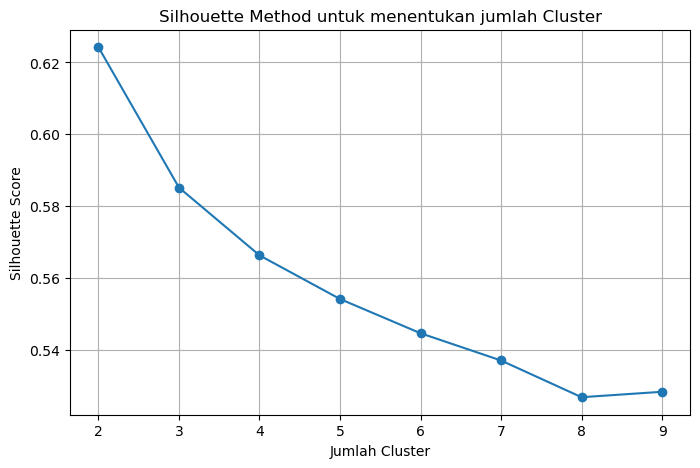

In [19]:
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# Ambil fitur
x = df[["Terukur mmbtu"]].copy()

# Scaling
scaler = StandardScaler()
scaled = scaler.fit_transform(x)

# Hitung Silhouette Score untuk berbagai jumlah cluster
silhouette_scores = []

range_n_clusters = range(2, 10)  # mulai dari 2 cluster, karena silhouette butuh minimal 2 cluster
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
    cluster_labels = kmeans.fit_predict(scaled)
    silhouette_avg = silhouette_score(scaled, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Plot
plt.figure(figsize=(8,5))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.xlabel("Jumlah Cluster")
plt.ylabel("Silhouette Score")
plt.title('Silhouette Method untuk menentukan jumlah Cluster')
plt.grid(True)
plt.show()


## K Means

In [21]:
mean_perusahaan = df.groupby('Account Name')['Terukur mmbtu'].mean().reset_index()

scaler = StandardScaler()
mean_scaled = scaler.fit_transform(mean_perusahaan[['Terukur mmbtu']])

kmeans = KMeans(n_clusters=2, random_state=42, n_init='auto')
mean_perusahaan['Kmean_Cluster'] = kmeans.fit_predict(mean_scaled)

D:\Terminal\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


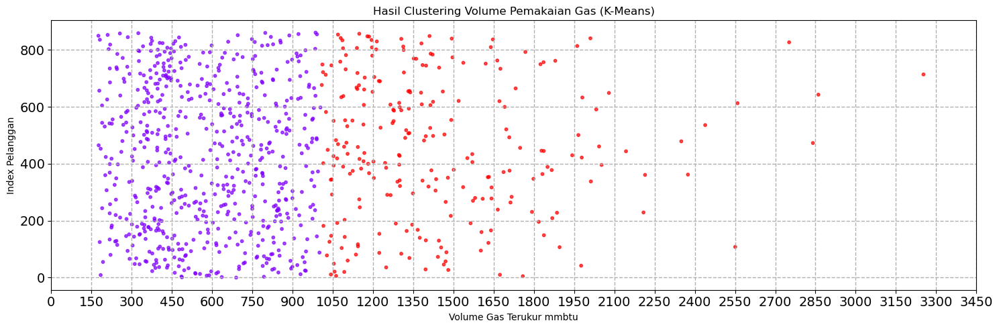

In [22]:
plt.figure(figsize=(15, 5))
plt.scatter(mean_perusahaan['Terukur mmbtu'], mean_perusahaan.index, c=mean_perusahaan['Kmean_Cluster'], cmap='rainbow', s=10, alpha=0.7)
plt.title('Hasil Clustering Volume Pemakaian Gas (K-Means)')
plt.xlabel('Volume Gas Terukur mmbtu')
plt.ylabel('Index Pelanggan')
max_x = df['Terukur mmbtu'].max()
plt.xticks(np.arange(0, max_x, 150), fontsize = 14)
plt.yticks(fontsize = 14)
plt.grid(True, linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()

In [23]:
cluster_stats = mean_perusahaan.groupby('Kmean_Cluster')['Terukur mmbtu'].describe()

print('\nDeskripsi Statistik Volume Pemakaian per Cluster :')
print(cluster_stats.to_markdown(tablefmt='grid', floatfmt='.2f'))


Deskripsi Statistik Volume Pemakaian per Cluster :
+-----------------+---------+---------+--------+---------+---------+---------+---------+---------+
|   Kmean_Cluster |   count |    mean |    std |     min |     25% |     50% |     75% |     max |
+=================+=========+=========+========+=========+=========+=========+=========+=========+
|               0 |  620.00 |  576.94 | 226.18 |  175.84 |  391.25 |  563.31 |  774.54 | 1003.88 |
+-----------------+---------+---------+--------+---------+---------+---------+---------+---------+
|               1 |  242.00 | 1438.61 | 376.71 | 1008.81 | 1149.66 | 1337.42 | 1631.84 | 3252.80 |
+-----------------+---------+---------+--------+---------+---------+---------+---------+---------+


In [24]:
kmeans = KMeans(n_clusters=2, random_state=42, n_init='auto')
df['K_Cluster'] = kmeans.fit_predict(scaled)

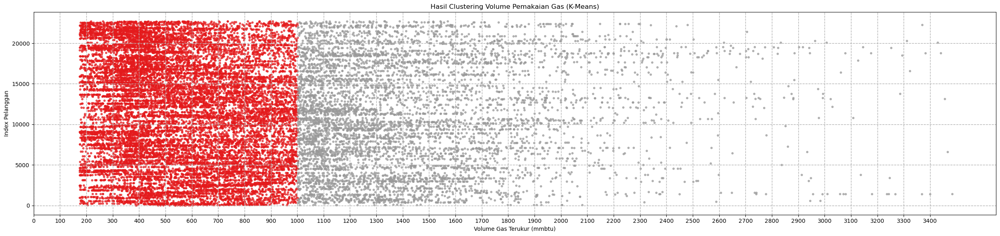

In [25]:
plt.figure(figsize=(25, 6))
plt.scatter(df['Terukur mmbtu'], df.index, c=df['K_Cluster'], cmap='Set1', s=10, alpha=0.7)
plt.title('Hasil Clustering Volume Pemakaian Gas (K-Means)')
plt.xlabel('Volume Gas Terukur (mmbtu)')
plt.ylabel('Index Pelanggan')
max_x = df['Terukur mmbtu'].max()
plt.xticks(np.arange(0, max_x, 100))
plt.grid(True, linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()

In [26]:
cluster_stats = df.groupby('K_Cluster')['Terukur mmbtu'].describe()

print('\nDeskripsi Statistik Volume Pemakaian per Cluster :')
print(cluster_stats.to_markdown(tablefmt='grid', floatfmt='.2f'))


Deskripsi Statistik Volume Pemakaian per Cluster :
+-------------+----------+---------+--------+---------+---------+---------+---------+---------+
|   K_Cluster |    count |    mean |    std |     min |     25% |     50% |     75% |     max |
+=============+==========+=========+========+=========+=========+=========+=========+=========+
|           0 | 16218.00 |  563.92 | 223.71 |  175.16 |  378.65 |  540.72 |  747.86 | 1001.67 |
+-------------+----------+---------+--------+---------+---------+---------+---------+---------+
|           1 |  6481.00 | 1436.37 | 381.45 | 1001.71 | 1146.28 | 1336.09 | 1623.96 | 3484.55 |
+-------------+----------+---------+--------+---------+---------+---------+---------+---------+


In [27]:
from sklearn.metrics import davies_bouldin_score

dbi_scores = []

for k in range (2, 6):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(scaled)
    dbi = davies_bouldin_score(scaled, labels)
    dbi_scores.append((k, dbi))

print("Rekapitulasi Davies-Bouldin Index:")
print("No\tJumlah Cluster\tNilai DBI")
for i, (k, dbi) in enumerate(dbi_scores, start=1):
    print(f"{i}\t{k}\t\t{dbi:.4f}")

Rekapitulasi Davies-Bouldin Index:
No	Jumlah Cluster	Nilai DBI
1	2		0.5548
2	3		0.5349
3	4		0.5432
4	5		0.5396


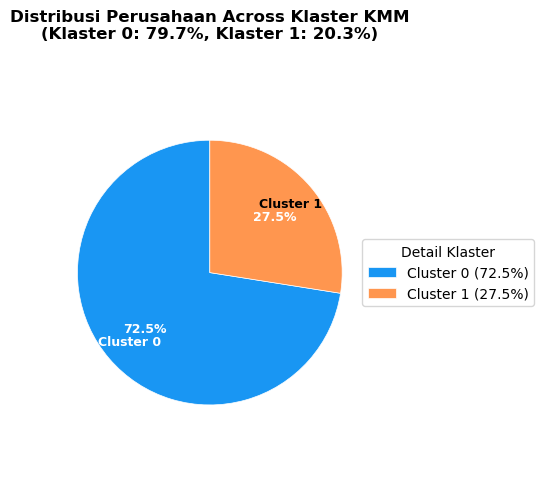

In [28]:
# Prepare data
counts = pd.Series({0: 72.5, 1: 27.5}) 
labels = [f'Cluster {i}' for i in counts.index]
colors = plt.cm.rainbow([0.2, 0.8])  # Menggunakan nilai yang berbeda untuk warna berbeda

# Create figure with constrained layout
plt.figure(figsize=(5, 5), dpi=100, facecolor='white')
plt.rcParams['font.size'] = 10

# Create pie chart with improved parameters
wedges, texts, autotexts = plt.pie(
    counts,
    labels=labels,
    autopct='%1.1f%%',  # Menampilkan semua persentase
    startangle=90,
    colors=colors,
    wedgeprops={'linewidth': 0.5, 'edgecolor': 'white'},
    pctdistance=0.65,
    labeldistance=0.8,
    textprops={
        'color': 'white',
        'weight': 'bold',
        'fontsize': 9
    }
)

# Improve label positioning and styling
for text, wedge in zip(texts, wedges):
    text.set_horizontalalignment('center')
    text.set_verticalalignment('center')
    r, g, b, _ = wedge.get_facecolor()
    text.set_color('black' if (r*0.299 + g*0.587 + b*0.114) > 0.6 else 'white')

# Add title with padding
plt.title(
    'Distribusi Perusahaan Across Klaster KMM\n(Klaster 0: 79.7%, Klaster 1: 20.3%)',
    pad=20,
    fontweight='bold',
    fontsize=12
)

# Add legend
plt.legend(
    wedges,
    [f'{l} ({c}%)' for l, c in zip(labels, counts)],
    title="Detail Klaster",
    loc="center left",
    bbox_to_anchor=(1, 0.5)
)

plt.axis('equal')
plt.tight_layout()
plt.show()

## Hierarchical Clustering

### Hierarchical Clustering 2 Cluster

In [31]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

mean_perusahaanhd = df.groupby('Account Name')['Terukur mmbtu'].mean().reset_index()

x = mean_perusahaanhd[['Terukur mmbtu']]
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Hitung linkage matrix
linked = linkage(x_scaled, method='ward')

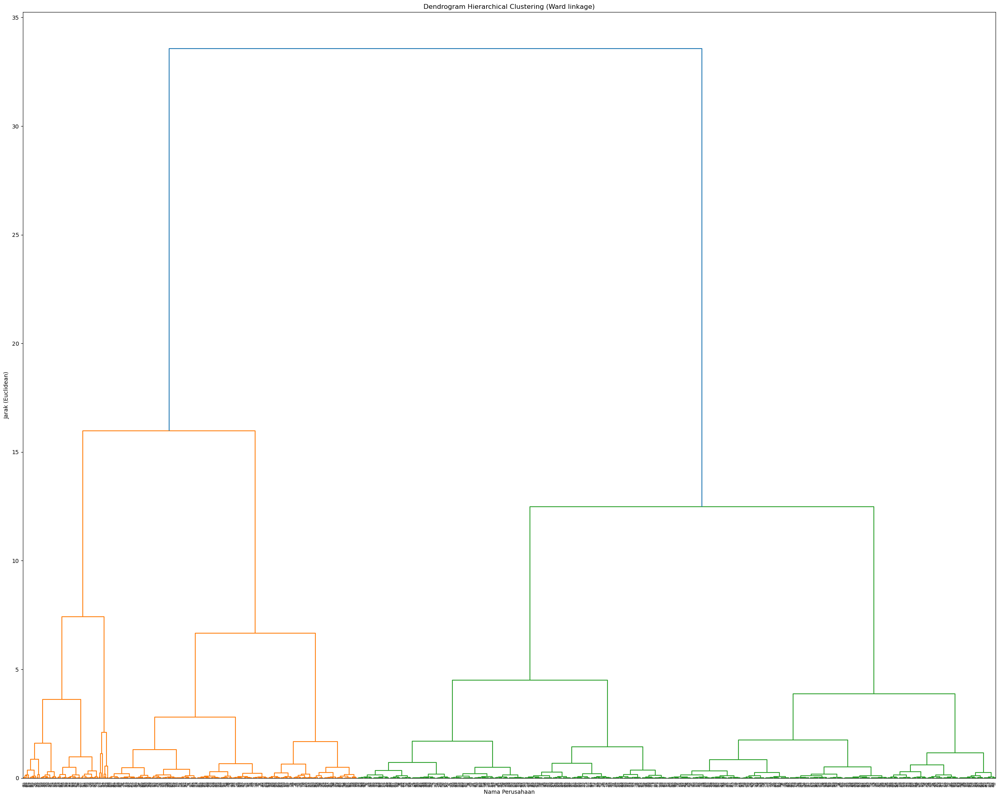

In [32]:
plt.figure(figsize=(25, 20))
dendrogram(linked,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=True)
plt.title('Dendrogram Hierarchical Clustering (Ward linkage)')
plt.xlabel('Nama Perusahaan')
plt.ylabel('Jarak (Euclidean)')
plt.tight_layout()
plt.show()

In [33]:
from sklearn.cluster import AgglomerativeClustering

mean_perusahaanh = df.groupby('Account Name')['Terukur mmbtu'].mean().reset_index()

x= mean_perusahaanh[['Terukur mmbtu']]
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

hierarchical = AgglomerativeClustering(n_clusters = 2, linkage='ward')
mean_perusahaanh['MeanH_cluster'] = hierarchical.fit_predict(x_scaled)

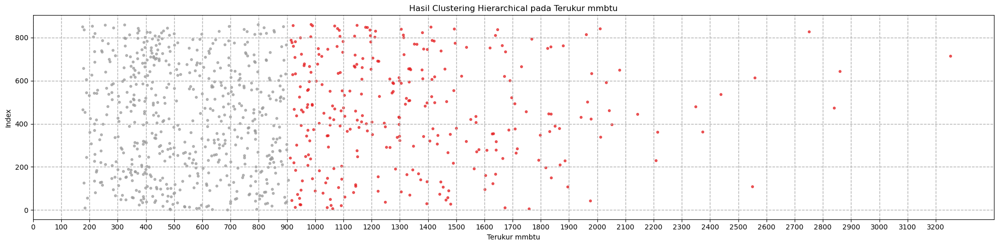

MeanH_cluster
1    566
0    296
Name: count, dtype: int64


In [34]:
plt.figure(figsize=(20,5))
plt.scatter(mean_perusahaanh['Terukur mmbtu'], mean_perusahaanh.index, c=mean_perusahaanh['MeanH_cluster'], cmap='Set1', s=10, alpha=0.7)
plt.title('Hasil Clustering Hierarchical pada Terukur mmbtu')
plt.xlabel('Terukur mmbtu')
plt.ylabel('Index')
max_x = mean_perusahaanh['Terukur mmbtu'].max()
plt.xticks(np.arange(0, max_x, 100))
plt.grid(True, linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()

print(mean_perusahaanh['MeanH_cluster'].value_counts())

In [35]:
cluster_stats = mean_perusahaanh.groupby('MeanH_cluster')['Terukur mmbtu'].describe()

print('\nDeskripsi Statistik Volume Pemakaian per Cluster :')
print(cluster_stats.to_markdown(tablefmt='grid', floatfmt='.2f'))


Deskripsi Statistik Volume Pemakaian per Cluster :
+-----------------+---------+---------+--------+--------+---------+---------+---------+---------+
|   MeanH_cluster |   count |    mean |    std |    min |     25% |     50% |     75% |     max |
+=================+=========+=========+========+========+=========+=========+=========+=========+
|               0 |  296.00 | 1350.65 | 388.39 | 912.11 | 1055.93 | 1274.08 | 1536.16 | 3252.80 |
+-----------------+---------+---------+--------+--------+---------+---------+---------+---------+
|               1 |  566.00 |  540.73 | 202.26 | 175.84 |  376.56 |  512.51 |  715.85 |  905.42 |
+-----------------+---------+---------+--------+--------+---------+---------+---------+---------+


In [36]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

mean_perusahaanhd = df.groupby('Account Name')['Terukur mmbtu'].mean().reset_index()

x = mean_perusahaanhd[['Terukur mmbtu']]
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

# Hitung linkage matrix
linked = linkage(x_scaled, method='ward')

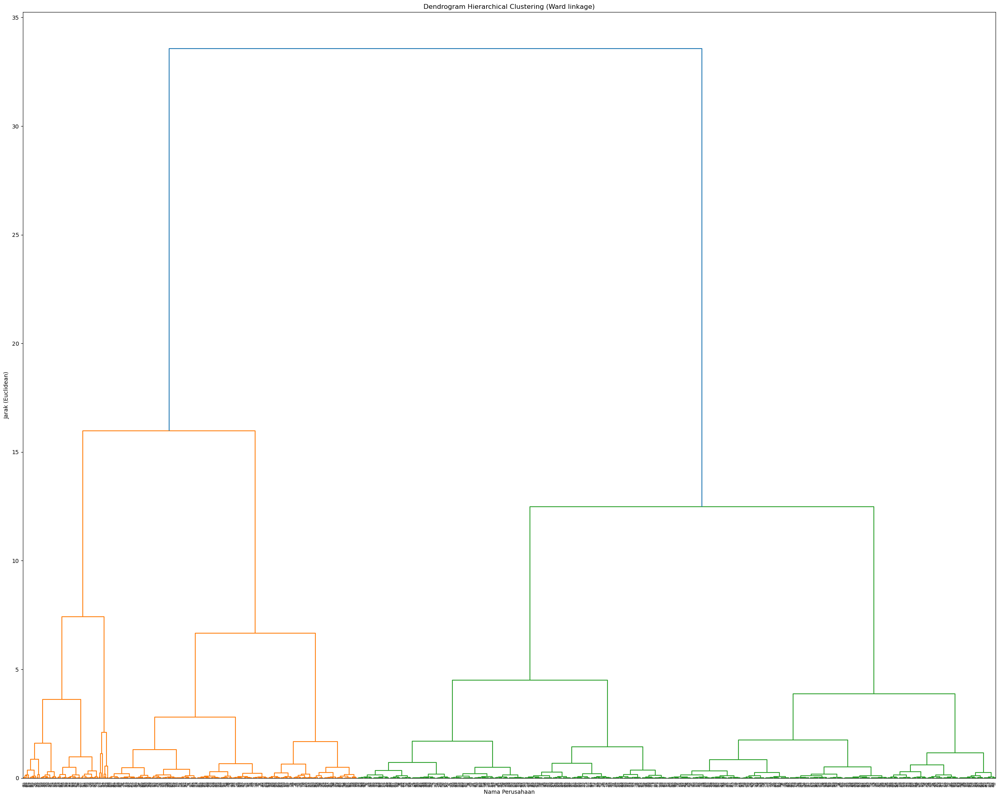

In [37]:
plt.figure(figsize=(25, 20))
dendrogram(linked,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=True)
plt.title('Dendrogram Hierarchical Clustering (Ward linkage)')
plt.xlabel('Nama Perusahaan')
plt.ylabel('Jarak (Euclidean)')
plt.tight_layout()
plt.show()

In [38]:
from sklearn.cluster import AgglomerativeClustering

x= df[['Terukur m3']]
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

hierarchical = AgglomerativeClustering(n_clusters = 2, linkage='ward')
df['H_cluster'] = hierarchical.fit_predict(x_scaled)


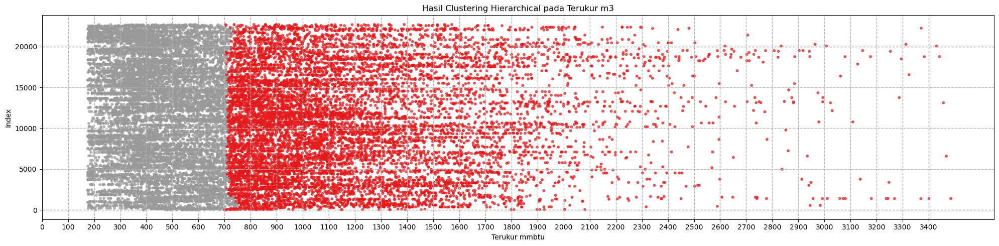

H_cluster
1    11565
0    11134
Name: count, dtype: int64


In [39]:
plt.figure(figsize=(20,5))
plt.scatter(df['Terukur mmbtu'], df.index, c=df['H_cluster'], cmap='Set1', s=10, alpha=0.7)
plt.title('Hasil Clustering Hierarchical pada Terukur m3')
plt.xlabel('Terukur mmbtu')
plt.ylabel('Index')
max_x = df['Terukur mmbtu'].max()
plt.xticks(np.arange(0, max_x, 100))
plt.grid(True, linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()

print(df['H_cluster'].value_counts())

In [40]:
cluster_stats = df.groupby('H_cluster')['Terukur mmbtu'].describe()

print('\nDeskripsi Statistik Volume Pemakaian per Cluster :')
print(cluster_stats.to_markdown(tablefmt='grid', floatfmt='.2f'))


Deskripsi Statistik Volume Pemakaian per Cluster :
+-------------+----------+---------+--------+--------+--------+---------+---------+---------+
|   H_cluster |    count |    mean |    std |    min |    25% |     50% |     75% |     max |
+=============+==========+=========+========+========+========+=========+=========+=========+
|           0 | 11134.00 | 1191.60 | 413.56 | 698.16 | 874.97 | 1080.99 | 1402.31 | 3484.55 |
+-------------+----------+---------+--------+--------+--------+---------+---------+---------+
|           1 | 11565.00 |  448.55 | 144.98 | 175.16 | 336.22 |  439.81 |  568.54 |  750.36 |
+-------------+----------+---------+--------+--------+--------+---------+---------+---------+


# Summary

In [75]:
import pandas as pd

# Pastikan kolom bertipe float
df['Terukur mmbtu'] = df['Terukur mmbtu'].astype(float)

summary_list = []

for perusahaan in df['Account Name'].unique():
    data_perusahaan = df[df['Account Name'] == perusahaan]
    total_data = len(data_perusahaan)

    mean_volume = data_perusahaan['Terukur mmbtu'].mean()
    median_volume = data_perusahaan['Terukur mmbtu'].median()
    min_volume = data_perusahaan['Terukur mmbtu'].min()
    max_volume = data_perusahaan['Terukur mmbtu'].max()

    # Kelompokkan sesuai range
    data_0_350 = data_perusahaan[(data_perusahaan['Terukur mmbtu'] >= 0) & (data_perusahaan['Terukur mmbtu'] < 350)]
    data_351_875 = data_perusahaan[(data_perusahaan['Terukur mmbtu'] >= 350) & (data_perusahaan['Terukur mmbtu'] <= 875)]
    data_0_875 = data_perusahaan[(data_perusahaan['Terukur mmbtu'] >= 0) & (data_perusahaan['Terukur mmbtu'] <= 875)]
    data_876_1750 = data_perusahaan[(data_perusahaan['Terukur mmbtu'] > 875) & (data_perusahaan['Terukur mmbtu'] <= 1750)]
    data_1750_up = data_perusahaan[data_perusahaan['Terukur mmbtu'] > 1750]
    data_876_up = data_perusahaan[data_perusahaan['Terukur mmbtu'] > 875]

    # Hitung jumlah (pakai int untuk pastikan akurat)
    jumlah_0_350 = int(len(data_0_350))
    jumlah_351_875 = int(len(data_351_875))
    jumlah_0_875 = int(len(data_0_875))
    jumlah_876_1750 = int(len(data_876_1750))
    jumlah_1750_up = int(len(data_1750_up))
    jumlah_876_up = int(len(data_876_up))

    # Hitung persentase
    persentase_0_350 = round(jumlah_0_350 / total_data * 100, 2) if total_data > 0 else 0
    persentase_351_875 = round(jumlah_351_875 / total_data * 100, 2) if total_data > 0 else 0
    persentase_0_875 = round(jumlah_0_875 / total_data * 100, 2) if total_data > 0 else 0
    persentase_876_1750 = round(jumlah_876_1750 / total_data * 100, 2) if total_data > 0 else 0
    persentase_1750_up = round(jumlah_1750_up / total_data * 100, 2) if total_data > 0 else 0
    persentase_876_up = round(jumlah_876_up / total_data * 100, 2) if total_data > 0 else 0

    summary_list.append({
        'Account Name': perusahaan,
        'Mean_Volume': round(mean_volume, 2),
        'Median_Volume': round(median_volume, 2),
        'Min_Volume': round(min_volume, 2),
        'Max_Volume': round(max_volume, 2),
        'Total_Data': total_data,
        'Jumlah Dalam Range (0–350)': jumlah_0_350,
        'Persentase Dalam Range (0–350)': persentase_0_350,
        'Jumlah Dalam Range (351–875)': jumlah_351_875,
        'Persentase Dalam Range (351–875)': persentase_351_875,
        'Jumlah Dalam Range (876–1750)': jumlah_876_1750,
        'Persentase Dalam Range (876–1750)': persentase_876_1750,
        'Jumlah Dalam Range (>1750)': jumlah_1750_up,
        'Persentase Dalam Range (>1750)': persentase_1750_up,
        'Jumlah Dalam Range (0–875)': jumlah_0_875,
        'Persentase Dalam Range (0–875)': persentase_0_875,
        'Jumlah Dalam Range (>875)': jumlah_876_up,
        'Persentase Dalam Range (>875)': persentase_876_up
    })

# Konversi ke DataFrame hasil summary
summary_perusahaan = pd.DataFrame(summary_list)

# Tambahkan klasifikasi range
def categorize_1000(row):
    min_val = row['Min_Volume']
    max_val = row['Max_Volume']
    if max_val <= 875:
        return '0–875'
    elif min_val > 875:
        return '876–habis'
    else:
        return 'Fluktuatif'

summary_perusahaan['Range'] = summary_perusahaan.apply(categorize_1000, axis=1)

# Hitung jumlah kategori
range_count = summary_perusahaan['Range'].value_counts().reset_index()
range_count.columns = ['Range', 'Jumlah Account Name']

# Urutkan sesuai urutan logis
urutan_range = ['0–875', '876–habis', 'Fluktuatif']
range_count['Range'] = pd.Categorical(range_count['Range'], categories=urutan_range, ordered=True)
range_count = range_count.sort_values('Range').reset_index(drop=True)

# Simpan ke Excel
output_file = 'laporan_perusahaan_final.xlsx'
summary_perusahaan.to_excel(output_file, index=False)
print(f"✅ File Excel berhasil disimpan sebagai: {output_file}")

# Tampilkan hasil klasifikasi
print("\nJumlah Akun per Kategori Range:")
print(range_count)


✅ File Excel berhasil disimpan sebagai: laporan_perusahaan_final.xlsx

Jumlah Akun per Kategori Range:
        Range  Jumlah Account Name
0       0–875                  339
1   876–habis                  100
2  Fluktuatif                  423


In [77]:
def categorize(row):
    min_val = row['Min_Volume']
    max_val = row['Max_Volume']
    
    if min_val >= 0 and max_val <= 875:
        return '0–875'
    elif min_val > 875:
        return '876–habis'
    else:
        
        return 'Fluktuatif'

summary_perusahaan['Range'] = summary_perusahaan.apply(categorize, axis=1)

range_count = summary_perusahaan['Range'].value_counts().reset_index()
range_count.columns = ['Range', 'Jumlah Account Name']

urutan_range = ['0–875', '876–habis', 'Fluktuatif']
range_count['Range'] = pd.Categorical(range_count['Range'], categories=urutan_range, ordered=True)
range_count = range_count.sort_values('Range').reset_index(drop=True)

# Tampilkan hasil
print(range_count)

        Range  Jumlah Account Name
0       0–875                  339
1   876–habis                  100
2  Fluktuatif                  423


In [44]:
def categorize(row):
    min_val = row['Min_Volume']
    max_val = row['Max_Volume']
    
    if min_val >= 0 and max_val <= 349:
        return '0-349'
    elif min_val >= 350 and max_val <= 1000:
        return '350-1000'
    elif min_val >= 1001 and max_val <= 1750:
        return '1001-1750'
    elif min_val >= 1751:
        return '1751-habis'
    else:
        return 'Fluktuatif'

summary_perusahaan['Range'] = summary_perusahaan.apply(categorize, axis=1)

range_count = summary_perusahaan['Range'].value_counts().reset_index()
range_count.columns = ['Range', 'Jumlah Account Name']

urutan_range = ['0-349', '350-1000', '1001-1750', '1751-habis','Fluktuatif']
range_count['Range'] = pd.Categorical(range_count['Range'], categories=urutan_range, ordered=True)
range_count = range_count.sort_values('Range').reset_index(drop=True)

# Tampilkan hasil
print(range_count)

        Range  Jumlah Account Name
0       0-349                   49
1    350-1000                  109
2   1001-1750                   13
3  1751-habis                    8
4  Fluktuatif                  683


In [79]:
df_new = pd.read_excel(r"C:\Users\Aditya P J\Documents\Magang dan KKN\Magang\Proyek\laporan_perusahaan_final.xlsx")
df_new.head(30)
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 862 entries, 0 to 861
Data columns (total 19 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Account Name                       862 non-null    object 
 1   Mean_Volume                        862 non-null    float64
 2   Median_Volume                      862 non-null    float64
 3   Min_Volume                         862 non-null    float64
 4   Max_Volume                         862 non-null    float64
 5   Total_Data                         862 non-null    int64  
 6   Jumlah Dalam Range (0–350)         862 non-null    int64  
 7   Persentase Dalam Range (0–350)     862 non-null    float64
 8   Jumlah Dalam Range (351–875)       862 non-null    int64  
 9   Persentase Dalam Range (351–875)   862 non-null    float64
 10  Jumlah Dalam Range (876–1750)      862 non-null    int64  
 11  Persentase Dalam Range (876–1750)  862 non-null    float64

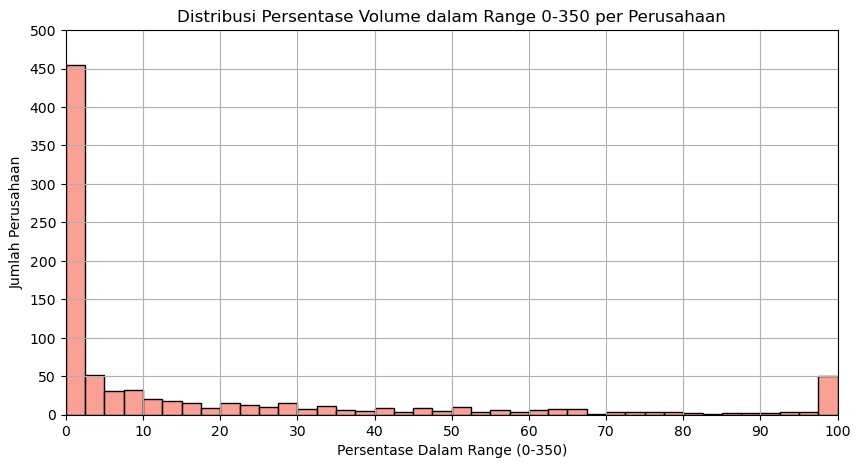

In [46]:
plt.figure(figsize=(10,6))
sns.histplot(df_new['Persentase Dalam Range (0–350)'], kde=False, bins=40, color='salmon')
plt.title('Distribusi Persentase Volume dalam Range 0-350 per Perusahaan')
plt.xlabel('Persentase Dalam Range (0-350)')
plt.ylabel('Jumlah Perusahaan')
plt.grid(True)
plt.xlim(0, 100)
plt.ylim(0, 500)
plt.xticks([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
plt.yticks(range(0, 501, 50))
plt.tight_layout()
plt.subplots_adjust(left=0.2, bottom=0.3)
plt.show()

C:\Users\Aditya P J\AppData\Local\Temp\ipykernel_15296\3443905789.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  percentage = f'{(value / totals[j] * 100):.1f}%'
C:\Users\Aditya P J\AppData\Local\Temp\ipykernel_15296\3443905789.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  percentage = f'{(value / totals[j] * 100):.1f}%'
C:\Users\Aditya P J\AppData\Local\Temp\ipykernel_15296\3443905789.py:53: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use

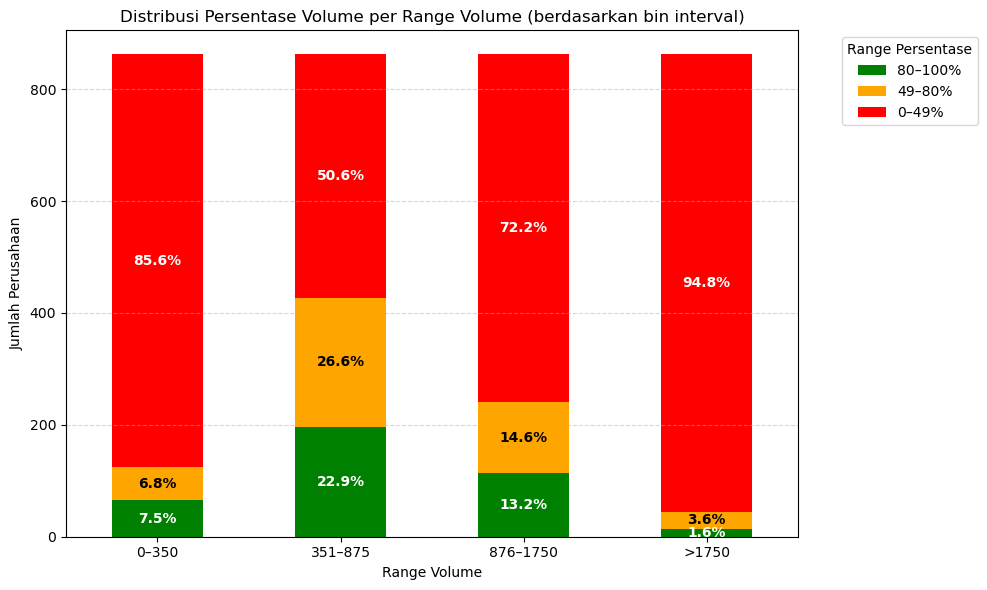


Tabel Frekuensi per Range:
              80–100%       49–80%        0–49%
0–350       65 (7.5%)    59 (6.8%)  738 (85.6%)
351–875   197 (22.9%)  229 (26.6%)  436 (50.6%)
876–1750  114 (13.2%)  126 (14.6%)  622 (72.2%)
>1750       14 (1.6%)    31 (3.6%)  817 (94.8%)


In [81]:
import pandas as pd
import matplotlib.pyplot as plt

# Definisikan bin
bins = [0, 49, 80, 100]

# Fungsi label bin
def format_range(bin_interval):
    return f"{int(bin_interval.left)}–{int(bin_interval.right)}%"

# Inisialisasi dataframe hasil
frekuensi_range_bin = pd.DataFrame()

# Loop setiap kolom persentase
for col, nama in zip(['Persentase Dalam Range (0–350)',
                      'Persentase Dalam Range (351–875)',
                      'Persentase Dalam Range (876–1750)',
                      'Persentase Dalam Range (>1750)'],
                     ['0–350', '351–875', '876–1750', '>1750']):
    # Hitung distribusi frekuensi dalam bin
    frekuensi = pd.cut(df_new[col], bins=bins, include_lowest=True).value_counts().sort_index()
    
    # Masukkan ke dataframe
    frekuensi_range_bin[nama] = frekuensi.values

# Format ulang index jadi label string
frekuensi_range_bin.index = [format_range(interval) for interval in frekuensi.index]

# Urutkan agar: 80–100% (green), 49–80% (orange), 0–49% (red)
frekuensi_range_bin = frekuensi_range_bin.loc[['80–100%', '49–80%', '0–49%']]

# Plot stacked bar chart
ax = frekuensi_range_bin.T.plot(kind='bar', stacked=True, figsize=(10,6),
                                color=['green', 'orange', 'red'])

plt.title('Distribusi Persentase Volume per Range Volume (berdasarkan bin interval)')
plt.ylabel('Jumlah Perusahaan')
plt.xlabel('Range Volume')
plt.xticks(rotation=0)
plt.legend(title='Range Persentase', bbox_to_anchor=(1.05, 1))
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()

# Hitung total per kategori range volume
totals = frekuensi_range_bin.T.sum(axis=1)

# Tambahkan label persentase di setiap bagian bar
for i, (colname, color) in enumerate(zip(['80–100%', '49–80%', '0–49%'], 
                                         ['green', 'orange', 'red'])):
    for j, (idx, row) in enumerate(frekuensi_range_bin.T.iterrows()):
        value = row[colname]
        if value > 0:
            percentage = f'{(value / totals[j] * 100):.1f}%'
            
            # Posisi teks
            if i == 0:
                y_pos = value / 2
            elif i == 1:
                y_pos = frekuensi_range_bin.T.iloc[j]['80–100%'] + value / 2
            else:
                y_pos = frekuensi_range_bin.T.iloc[j][['80–100%', '49–80%']].sum() + value / 2
            
            ax.text(j, y_pos, percentage, 
                    ha='center', va='center',
                    color='white' if color in ['green', 'red'] else 'black',
                    fontweight='bold')

plt.show()

# Tampilkan tabel frekuensi + persentase
print("\nTabel Frekuensi per Range:")
percentage_df = (frekuensi_range_bin.T.div(totals, axis=0) * 100)
combined_df = frekuensi_range_bin.T.astype(str) + " (" + percentage_df.round(1).astype(str) + "%)"
print(combined_df.to_string())


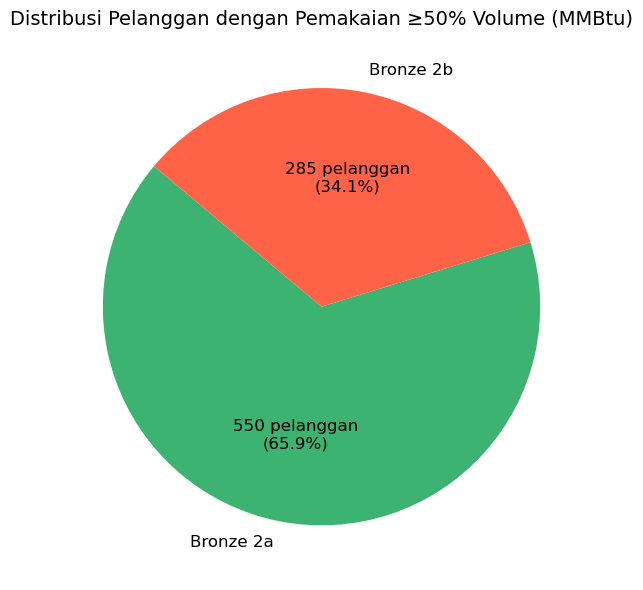

Jumlah pelanggan dengan ≥50% pemakaian di range ≤1000 MMBtu: 550
Jumlah pelanggan dengan ≥50% pemakaian di range >1000 MMBtu: 285


In [83]:
import pandas as pd
import matplotlib.pyplot as plt

# Definisikan bin untuk persentase utilisasi
bins = [0, 49, 80, 100]

# Fungsi label bin
def format_range(bin_interval):
    return f"{int(bin_interval.left)}–{int(bin_interval.right)}%"

# Inisialisasi dataframe hasil
frekuensi_range_bin = pd.DataFrame()

# Update range volume dan label sesuai satuan MMBtu
for col, nama in zip(['Persentase Dalam Range (0–350)',
                      'Persentase Dalam Range (351–875)',
                      'Persentase Dalam Range (876–1750)',
                      'Persentase Dalam Range (>1750)'],
                     ['0–350', '351–875', '876–1750', '>1750']):
    
    frekuensi = pd.cut(df_new[col], bins=bins, include_lowest=True).value_counts().sort_index()
    frekuensi_range_bin[nama] = frekuensi.values

# Format ulang index jadi label string
frekuensi_range_bin.index = [format_range(interval) for interval in frekuensi.index]

# Gabungkan untuk pie chart:
# Group 1: ≤1000 MMBtu → 0–350 + 351–1000
# Group 2: >1000 MMBtu → 1001–1750 + >1750
range_le_1000 = frekuensi_range_bin.loc[['80–100%', '49–80%'], ['0–350', '351–875']].sum().sum()
range_gt_1000 = frekuensi_range_bin.loc[['80–100%', '49–80%'], ['876–1750', '>1750']].sum().sum()

# Siapkan data pie chart
labels = ['Bronze 2a', 'Bronze 2b']
values = [range_le_1000, range_gt_1000]
colors = ['mediumseagreen', 'tomato']

# Fungsi label pie chart: jumlah + persentase
def make_autopct(values):
    def autopct(pct):
        total = sum(values)
        val = int(round(pct * total / 100.0))
        return f"{val} pelanggan\n({pct:.1f}%)"
    return autopct

# Plot pie chart
plt.figure(figsize=(6, 6))
plt.pie(values, labels=labels, autopct=make_autopct(values), colors=colors,
        startangle=140, textprops={'fontsize': 12})
plt.title('Distribusi Pelanggan dengan Pemakaian ≥50% Volume (MMBtu)', fontsize=14)
plt.tight_layout()
plt.show()

# Cetak nilai aktual
print(f"Jumlah pelanggan dengan ≥50% pemakaian di range ≤1000 MMBtu: {range_le_1000}")
print(f"Jumlah pelanggan dengan ≥50% pemakaian di range >1000 MMBtu: {range_gt_1000}")


In [87]:
# Filter pelanggan Bronze 1a (≥50% pemakaian di range 0–4500 m³)
bronze_2a = df_new[
    (df_new['Persentase Dalam Range (0–875)'] >= 50)  # Ambil yang ≥50% di range gabungan 0–4500
]
total_volume_2a = bronze_2a['Mean_Volume'].sum()  # Gunakan mean volume per pelanggan

# Filter pelanggan Bronze 1b (≥50% pemakaian di range >4500 m³)
bronze_2b = df_new[
    (df_new['Persentase Dalam Range (>875)'] >= 50)  # Ambil yang ≥50% di range >4500
]
total_volume_2b = bronze_2b['Mean_Volume'].sum()  # Gunakan mean volume per pelanggan

# Output hasil
print(f"Total Volume Aktual Bronze 1a (0–875 mmbtu): {total_volume_2a:.2f} mmbtu")
print(f"Total Volume Aktual Bronze 1b (>875 mmbtu): {total_volume_2b:.2f} mmbtu")
print(f"Perbandingan: Bronze 1b/Bronze 1a = {total_volume_2b/total_volume_2a:.2f}x")

Total Volume Aktual Bronze 1a (0–875 mmbtu): 309074.81 mmbtu
Total Volume Aktual Bronze 1b (>875 mmbtu): 406334.44 mmbtu
Perbandingan: Bronze 1b/Bronze 1a = 1.31x


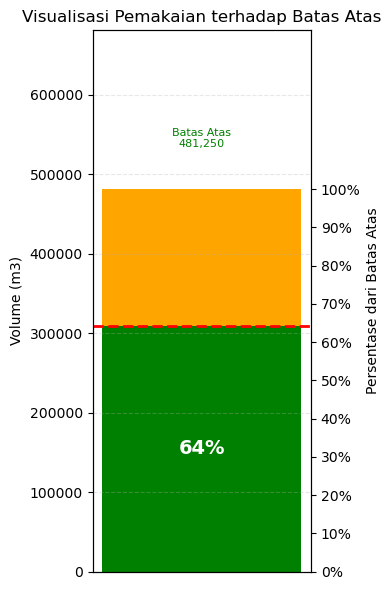

In [93]:
import matplotlib.pyplot as plt

# Data
batas_bawah = 192500 
rata_rata = 309074
batas_atas = 481250

# Hitung persentase terhadap batas atas
persentase = rata_rata / batas_atas * 100
tinggi_hijau = rata_rata
tinggi_oranye = batas_atas - rata_rata

# Plot
fig, ax1 = plt.subplots(figsize=(4, 6))

# Batang hijau: dari 0 ke rata-rata
ax1.bar(x=[''], height=[tinggi_hijau], bottom=0, color='green', width=0.5)

# Batang oranye: dari rata-rata ke batas atas
ax1.bar(x=[''], height=[tinggi_oranye], bottom=rata_rata, color='orange', width=0.5)

# Garis rata-rata
ax1.axhline(y=rata_rata, color='red', linestyle='--', linewidth=2)
ax1.text(0, rata_rata + 50000, f'Rata-rata\n{rata_rata:,}', ha='center', va='bottom', fontsize=9, color='orange')

# Label batas bawah dan atas
ax1.text(0, batas_atas + 50000, f'Batas Atas\n{batas_atas:,}', ha='center', va='bottom', fontsize=8, color='green')

# Label persentase di tengah batang hijau
ax1.text(0, tinggi_hijau / 2, f'{persentase:.0f}%', ha='center', va='center', fontsize=14, color='white', weight='bold')

# Styling axis utama
ax1.set_ylabel('Volume (m3)', fontsize=10)
ax1.set_ylim(0, batas_atas + 200_000)
ax1.set_xticks([])
ax1.set_title('Visualisasi Pemakaian terhadap Batas Atas', fontsize=12)
ax1.grid(axis='y', linestyle='--', alpha=0.3)

# Skala kedua (persentase)
ax2 = ax1.twinx()
ax2.set_ylim(ax1.get_ylim())
persen_ticks = [i for i in range(0, 110, 10)]
persen_values = [(p / 100) * batas_atas for p in persen_ticks]
ax2.set_yticks(persen_values)
ax2.set_yticklabels([f'{p}%' for p in persen_ticks])
ax2.set_ylabel('Persentase dari Batas Atas', fontsize=10)

plt.tight_layout()
plt.show()


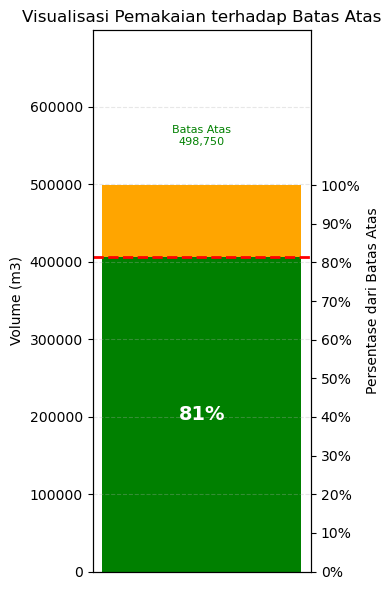

In [91]:
import matplotlib.pyplot as plt

# Data
batas_bawah = 249660 
rata_rata = 406334
batas_atas = 498750

# Hitung persentase terhadap batas atas
persentase = rata_rata / batas_atas * 100
tinggi_hijau = rata_rata
tinggi_oranye = batas_atas - rata_rata

# Plot
fig, ax1 = plt.subplots(figsize=(4, 6))

# Batang hijau: dari 0 ke rata-rata
ax1.bar(x=[''], height=[tinggi_hijau], bottom=0, color='green', width=0.5)

# Batang oranye: dari rata-rata ke batas atas
ax1.bar(x=[''], height=[tinggi_oranye], bottom=rata_rata, color='orange', width=0.5)

# Garis rata-rata
ax1.axhline(y=rata_rata, color='red', linestyle='--', linewidth=2)
ax1.text(0, rata_rata + 50000, f'Rata-rata\n{rata_rata:,}', ha='center', va='bottom', fontsize=9, color='orange')

# Label batas bawah dan atas
ax1.text(0, batas_atas + 50000, f'Batas Atas\n{batas_atas:,}', ha='center', va='bottom', fontsize=8, color='green')

# Label persentase di tengah batang hijau
ax1.text(0, tinggi_hijau / 2, f'{persentase:.0f}%', ha='center', va='center', fontsize=14, color='white', weight='bold')

# Styling axis utama
ax1.set_ylabel('Volume (m3)', fontsize=10)
ax1.set_ylim(0, batas_atas + 200_000)
ax1.set_xticks([])
ax1.set_title('Visualisasi Pemakaian terhadap Batas Atas', fontsize=12)
ax1.grid(axis='y', linestyle='--', alpha=0.3)

# Skala kedua (persentase)
ax2 = ax1.twinx()
ax2.set_ylim(ax1.get_ylim())
persen_ticks = [i for i in range(0, 110, 10)]
persen_values = [(p / 100) * batas_atas for p in persen_ticks]
ax2.set_yticks(persen_values)
ax2.set_yticklabels([f'{p}%' for p in persen_ticks])
ax2.set_ylabel('Persentase dari Batas Atas', fontsize=10)

plt.tight_layout()
plt.show()


In [ ]:
# Hitung total per range (sum across bins)
total_per_range = frekuensi_range_bin.T.sum(axis=1)

# Hitung kenaikan persentase antar range
kenaikan_pct = total_per_range.pct_change() * 100
kenaikan_pct = kenaikan_pct.round(2).astype(str) + '%'
kenaikan_pct.iloc[0] = '—'  # Baris pertama tidak ada baseline

# Transpose supaya range jadi baris
summary_df = frekuensi_range_bin.T.copy()

# Tambahkan kolom baru dengan nilai 185% (atau nilai sesuai dengan perhitungan)
summary_df['Kenaikan (%)'] = [350, 185, 75, 0]  # Sesuaikan dengan jumlah baris

# Urutkan kolom supaya rapih
summary_df = summary_df[['0–20%', '20–49%', '49–80%', '80–100%', 'Kenaikan (%)']]

# Tampilkan hasil summary
print("\nTabel Summary:")
print(summary_df.to_string())


In [ ]:
nama_perusahaan = df['Account Name'].unique() 
print(nama_perusahaan)

nama_perusahaan_df = pd.DataFrame(nama_perusahaan, columns=['Account Name'])
print(nama_perusahaan_df)

In [ ]:
mean_sector = df.groupby('Sektor Industri')['Terukur mmbtu'].mean().reset_index()

np.random.seed(42)
sector_mapping = {sector: i for i, sector in enumerate(df['Sektor Industri'].unique())}
mean_sector['X_code'] = mean_sector['Sektor Industri'].map(sector_mapping)
mean_sector['X_jittered'] = mean_sector['X_code'] + np.random.normal(0, 0.3, size=len(mean_sector))

plt.figure(figsize=(20, 15))

sns.scatterplot(
    x='X_jittered',
    y='Terukur mmbtu',
    hue='Sektor Industri',
    data=mean_sector,
    palette='tab20',  
    alpha=0.7,
    legend='full',
    s = 150
)

sorted_sectors = sorted(sector_mapping.items(), key=lambda x: x[1])
plt.xticks(
    ticks=[code for sector, code in sorted_sectors],
    labels=[sector for sector, code in sorted_sectors],
    rotation=45,
    ha='right'
)

for threshold in [350, 1000, 1750]:
    plt.axhline(y=threshold, color='red', linestyle='--', linewidth=2)

plt.ylabel('Volume Terukur (mmbtu)')
plt.xlabel('Sektor Industri')
plt.title('Sebaran Volume Pemakaian Gas Bronze 2 per Industri')
max_y = mean_sector['Terukur mmbtu'].max()
plt.yticks(np.arange(0, max_x, 100))
plt.grid(True)
plt.tight_layout()
plt.legend(title='Sektor Industri', bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.show()


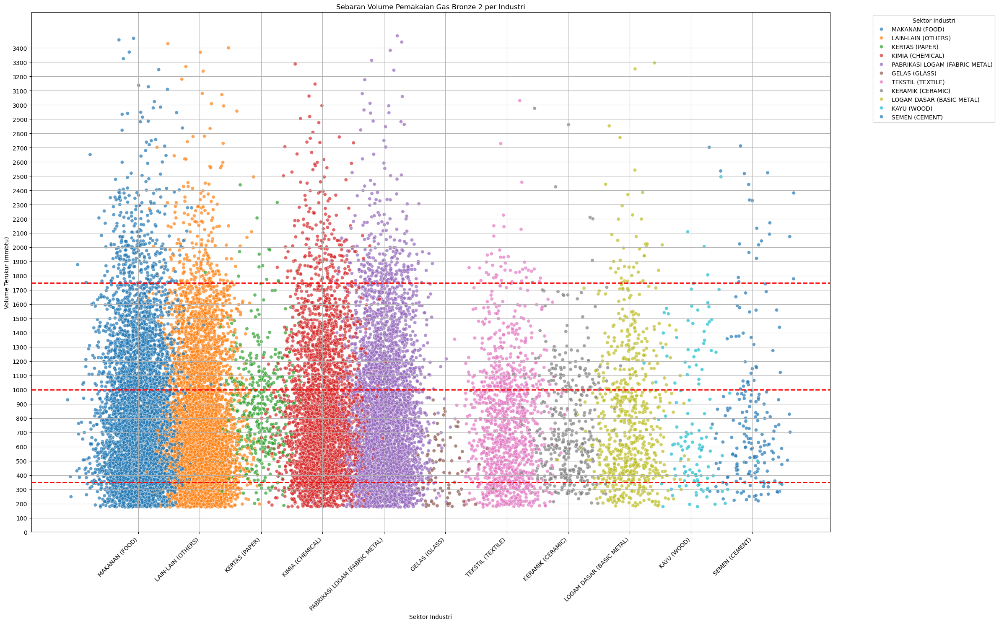

In [65]:
np.random.seed(42)
manual_order = ['MAKANAN (FOOD)', 'LAIN-LAIN (OTHERS)', 'KERTAS (PAPER)', 'KIMIA (CHEMICAL)', 'PABRIKASI LOGAM (FABRIC METAL)', 'GELAS (GLASS)', 'TEKSTIL (TEXTILE)', 'KERAMIK (CERAMIC)', 'LOGAM DASAR (BASIC METAL)', 'KAYU (WOOD)', 'SEMEN (CEMENT)']
sector_mapping = {sector: i for i, sector in enumerate(manual_order)}
df['X_code'] = df['Sektor Industri'].map(sector_mapping)
df['X_jittered'] = df['X_code'] + np.random.normal(0, 0.3, size=len(df))

plt.figure(figsize=(20, 15))

sns.scatterplot(
    x='X_jittered',
    y='Terukur mmbtu',
    hue='Sektor Industri',
    hue_order=manual_order,
    data=df,
    palette= 'tab10', 
    alpha=0.7,
    legend='full'
)

sorted_sectors = sorted(sector_mapping.items(), key=lambda x: x[1])
plt.xticks(
    ticks=[code for sector, code in sorted_sectors],
    labels=[sector for sector, code in sorted_sectors],
    rotation=45,
    ha='right'
)

for threshold in [350, 1000, 1750]:
    plt.axhline(y=threshold, color='red', linestyle='--', linewidth=2)

plt.ylabel('Volume Terukur (mmbtu)')
plt.xlabel('Sektor Industri')
plt.title('Sebaran Volume Pemakaian Gas Bronze 2 per Industri')
max_y = df['Terukur mmbtu'].max()
plt.yticks(np.arange(0, max_y, 100))
plt.grid(True)
plt.tight_layout()
plt.legend(title='Sektor Industri', bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.show()


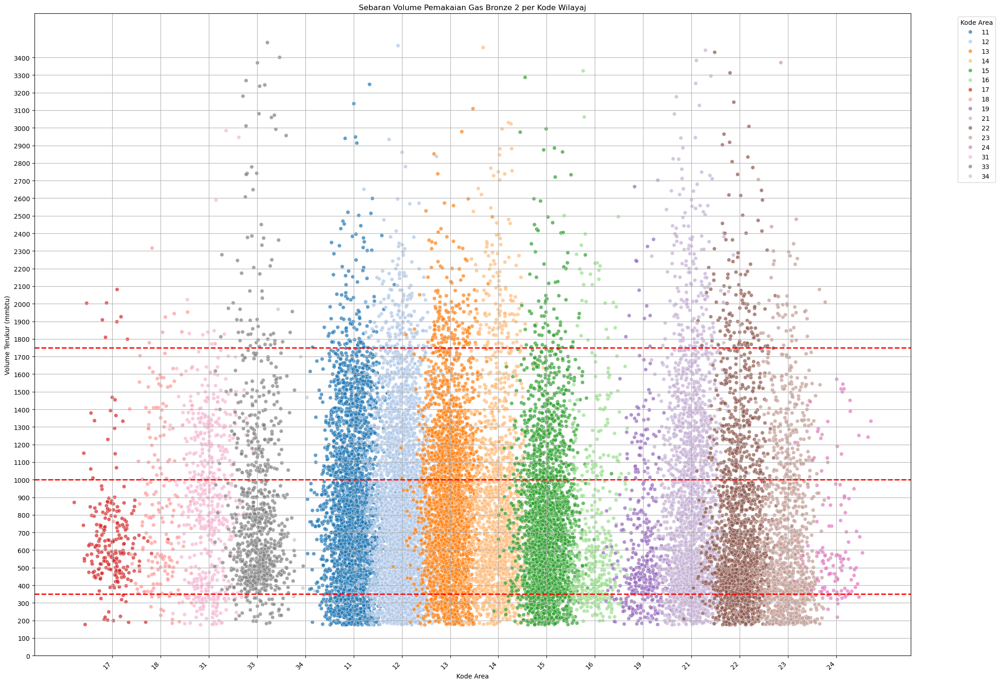

In [66]:
np.random.seed(42)
area_mapping = {area: i for i, area in enumerate(df['Kode Area'].unique())}
df['X_code'] = df['Kode Area'].map(area_mapping)
df['X_jittered'] = df['X_code'] + np.random.normal(0, 0.3, size=len(df))

plt.figure(figsize=(20, 15))

sns.scatterplot(
    x='X_jittered',
    y='Terukur mmbtu',
    hue='Kode Area',
    data=df,
    palette='tab20',  
    alpha=0.7,
    legend='full'
)

sorted_area = sorted(area_mapping.items(), key=lambda x: x[1])
plt.xticks(
    ticks=[code for area, code in sorted_area],
    labels=[area for area, code in sorted_area],
    rotation=45,
    ha='right'
)

for threshold in [350, 1000, 1750]:
    plt.axhline(y=threshold, color='red', linestyle='--', linewidth=2)

plt.ylabel('Volume Terukur (mmbtu)')
plt.xlabel('Kode Area')
plt.title('Sebaran Volume Pemakaian Gas Bronze 2 per Kode Wilayaj')
max_y = df['Terukur mmbtu'].max()
plt.yticks(np.arange(0, max_y, 100))
plt.grid(True)
plt.tight_layout()
plt.legend(title='Kode Area', bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.show()


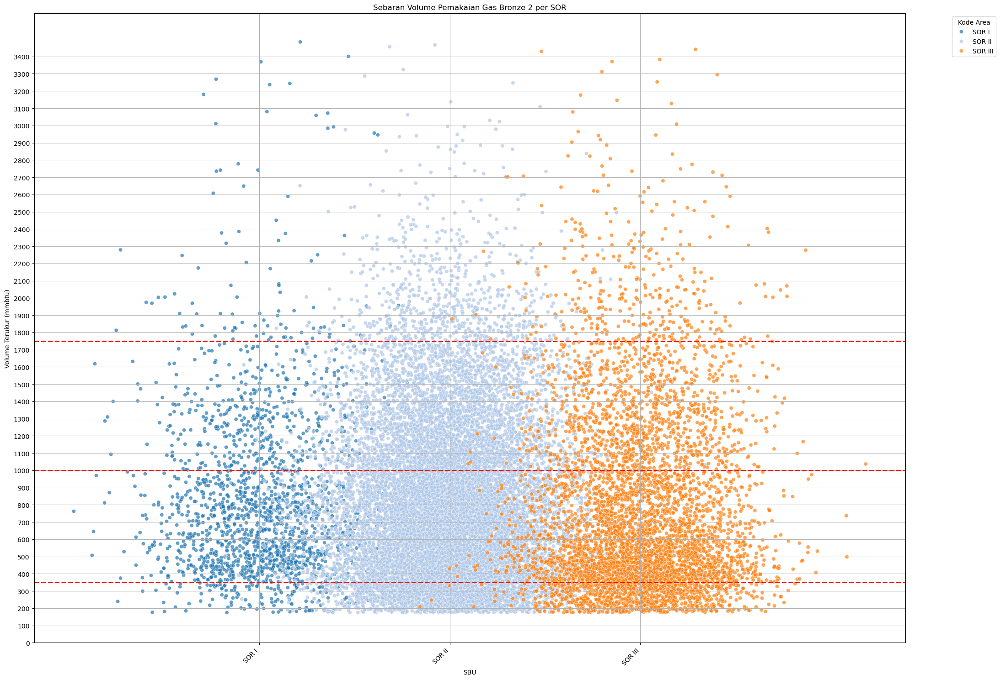

In [67]:
np.random.seed(42)
SBU_mapping = {SBU: i for i, SBU in enumerate(df['SBU'].unique())}
df['X_code'] = df['SBU'].map(SBU_mapping)
df['X_jittered'] = df['X_code'] + np.random.normal(0, 0.3, size=len(df))

plt.figure(figsize=(20, 15))

sns.scatterplot(
    x='X_jittered',
    y='Terukur mmbtu',
    hue='SBU',
    data=df,
    palette='tab20',  
    alpha=0.7,
    legend='full'
)

sorted_SBU = sorted(SBU_mapping.items(), key=lambda x: x[1])
plt.xticks(
    ticks=[code for SBU, code in sorted_SBU],
    labels=[SBU for SBU, code in sorted_SBU],
    rotation=45,
    ha='right'
)

for threshold in [350, 1000, 1750]:
    plt.axhline(y=threshold, color='red', linestyle='--', linewidth=2)

plt.ylabel('Volume Terukur (mmbtu)')
plt.xlabel('SBU')
plt.title('Sebaran Volume Pemakaian Gas Bronze 2 per SOR')
max_y = df['Terukur mmbtu'].max()
plt.yticks(np.arange(0, max_y, 100))
plt.grid(True)
plt.tight_layout()
plt.legend(title='Kode Area', bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.show()


C:\Users\Aditya P J\AppData\Local\Temp\ipykernel_15296\763584327.py:138: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


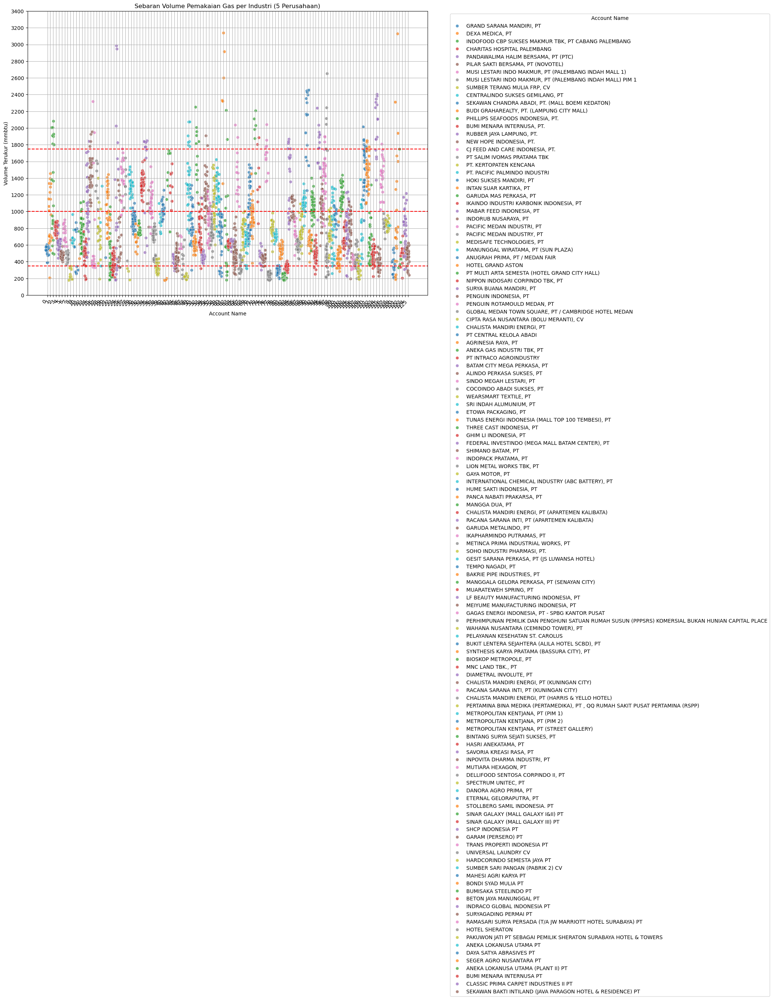

In [68]:
selected_companies = [
    'GRAND SARANA MANDIRI, PT', 'DEXA MEDICA, PT',
 'INDOFOOD CBP SUKSES MAKMUR TBK, PT CABANG PALEMBANG', 
 'CHARITAS HOSPITAL PALEMBANG', 'PANDAWALIMA HALIM BERSAMA, PT (PTC)',
 'PILAR SAKTI BERSAMA, PT (NOVOTEL)',
 'MUSI LESTARI INDO MAKMUR, PT (PALEMBANG INDAH MALL 1)',
 'MUSI LESTARI INDO MAKMUR, PT (PALEMBANG INDAH MALL) PIM 1',
 'SUMBER TERANG MULIA FRP, CV', 'CENTRALINDO SUKSES GEMILANG, PT',
 'SEKAWAN CHANDRA ABADI, PT. (MALL BOEMI KEDATON)',
 'BUDI GRAHAREALTY, PT. (LAMPUNG CITY MALL)', 'NESTLE INDONESIA, PT.',
 'PHILLIPS SEAFOODS INDONESIA, PT.', 'BUMI MENARA INTERNUSA, PT.',
 'RUBBER JAYA LAMPUNG, PT.', 'NEW HOPE INDONESIA, PT.',
 'CJ FEED AND CARE INDONESIA, PT.', 'PT SALIM IVOMAS PRATAMA TBK',
 'PT. KERTOPATEN KENCANA', 'PT. CENTRE POINT MEDAN' 'PT INDOJAYA AGRINUSA',
 'PT. PACIFIC PALMINDO INDUSTRI', 'HOKI SUKSES MANDIRI, PT',
 'INTAN SUAR KARTIKA, PT', 'GARUDA MAS PERKASA, PT',
 'IKAINDO INDUSTRI KARBONIK INDONESIA, PT', 'MABAR FEED INDONESIA, PT',
 'INDORUB NUSARAYA, PT', 'PACIFIC MEDAN INDUSTRI, PT',
 'PACIFIC MEDAN INDUSTRY, PT', 'MEDISAFE TECHNOLOGIES, PT',
 'MANUNGGAL WIRATAMA, PT (SUN PLAZA)', 'ANUGRAH PRIMA, PT / MEDAN FAIR',
 'HOTEL GRAND ASTON', 'PT MULTI ARTA SEMESTA (HOTEL GRAND CITY HALL)',
 'NIPPON INDOSARI CORPINDO TBK, PT', 'SURYA BUANA MANDIRI, PT',
 'PENGUIN INDONESIA, PT', 'PENGUIN ROTAMOULD MEDAN, PT',
 'GLOBAL MEDAN TOWN SQUARE, PT / CAMBRIDGE HOTEL MEDAN',
 'CIPTA RASA NUSANTARA (BOLU MERANTI), CV', 'CHALISTA MANDIRI ENERGI, PT',
 'PT CENTRAL KELOLA ABADI' ,'AGRINESIA RAYA, PT',
 'ANEKA GAS INDUSTRI TBK, PT', 'PT INTRACO AGROINDUSTRY',
 'BATAM CITY MEGA PERKASA, PT', 'ALINDO PERKASA SUKSES, PT',
 'SINDO MEGAH LESTARI, PT', 'COCOINDO ABADI SUKSES, PT',
 'ENERGI GRAHA SAGARA, PT', 'WEARSMART TEXTILE, PT',
 'SRI INDAH ALUMUNIUM, PT', 'ETOWA PACKAGING, PT',
 'TUNAS ENERGI INDONESIA (MALL TOP 100 TEMBESI), PT',
 'THREE CAST INDONESIA, PT', 'GHIM LI INDONESIA, PT',
 'FEDERAL INVESTINDO (MEGA MALL BATAM CENTER), PT', 'SHIMANO BATAM, PT',
'INDOPACK PRATAMA, PT', 'LION METAL WORKS TBK, PT', 'GAYA MOTOR, PT','INTERNATIONAL CHEMICAL INDUSTRY (ABC BATTERY), PT', 'GRAHA PGAS'
 'BAKRIE SWASAKTI UTAMA, PT', 'HUME SAKTI INDONESIA, PT',
 'PANCA NABATI PRAKARSA, PT', 'MANGGA DUA, PT',
 'BAKRIE METAL INDUSTRIES, PT', 'BAKRIE SWASAKTI UTAMA, PT (THE GROOVE)',
 'CHALISTA MANDIRI ENERGI, PT (APARTEMEN KALIBATA)',
 'RACANA SARANA INTI, PT (APARTEMEN KALIBATA)', 'GARUDA METALINDO, PT',
 'IKAPHARMINDO PUTRAMAS, PT', 'METINCA PRIMA INDUSTRIAL WORKS, PT',
 'SOHO INDUSTRI PHARMASI, PT.',
 'GESIT SARANA PERKASA, PT (JS LUWANSA HOTEL)', 'TEMPO NAGADI, PT',
 'BAKRIE PIPE INDUSTRIES, PT', 'MANGGALA GELORA PERKASA, PT (SENAYAN CITY)',
 'MUARATEWEH SPRING, PT', 'LF BEAUTY MANUFACTURING INDONESIA, PT',
 'MEIYUME MANUFACTURING INDONESIA, PT',
 'GAGAS ENERGI INDONESIA, PT - SPBG KANTOR PUSAT',
 'PERHIMPUNAN PEMILIK DAN PENGHUNI SATUAN RUMAH SUSUN (PPPSRS) KOMERSIAL BUKAN HUNIAN CAPITAL PLACE',
 'WAHANA NUSANTARA (CEMINDO TOWER), PT', 'PELAYANAN KESEHATAN ST. CAROLUS',
 'PERKUMPULAN PERHIMPUNAN ST. CAROLUS VEREENIGING' 'BAKRIE AUTOPART, PT',
 'BUKIT LENTERA SEJAHTERA (ALILA HOTEL SCBD), PT',
 'SYNTHESIS KARYA PRATAMA (BASSURA CITY), PT', 'BIOSKOP METROPOLE, PT',
 'MNC LAND TBK., PT', 'DIAMETRAL INVOLUTE, PT',
 'CHALISTA MANDIRI ENERGI, PT (KUNINGAN CITY)',
 'RACANA SARANA INTI, PT (KUNINGAN CITY)',
 'CHALISTA MANDIRI ENERGI, PT (HARRIS & YELLO HOTEL)',
 'PERTAMINA BINA MEDIKA (PERTAMEDIKA), PT , QQ RUMAH SAKIT PUSAT PERTAMINA (RSPP)',
 'METROPOLITAN KENTJANA, PT (PIM 1)', 'METROPOLITAN KENTJANA, PT (PIM 2)',
 'METROPOLITAN KENTJANA, PT (STREET GALLERY)',
 'BINTANG SURYA SEJATI SUKSES, PT', 'HASRI ANEKATAMA, PT',
 'SAVORIA KREASI RASA, PT', 'INPOVITA DHARMA INDUSTRI, PT',
 'MUTIARA HEXAGON, PT', 'DELLIFOOD SENTOSA CORPINDO II, PT',
 'SPECTRUM UNITEC, PT', 'DANORA AGRO PRIMA, PT', 'ETERNAL GELORAPUTRA, PT',
     'STOLLBERG SAMIL INDONESIA. PT', 'SINAR GALAXY (MALL GALAXY I&II) PT',
 'SINAR GALAXY (MALL GALAXY III) PT', 'SHCP INDONESIA PT',
 'GARAM (PERSERO) PT', 'TRANS PROPERTI INDONESIA PT', 'UNIVERSAL LAUNDRY CV',
 'HARDCORINDO SEMESTA JAYA PT', 'SUMBER SARI PANGAN (PABRIK 2) CV',
 'SIKA INDONESIA PT' 'MALINDO FEEDMILL, TBK PT',
 'INOVASI TEKNOLOGI KOSMETIKA PT' 'SINAR ANGKASA RUNGKUT I PT',
 'MAHESI AGRI KARYA PT', 'BONDI SYAD MULIA PT', 'BUMISAKA STEELINDO PT',
 'BETON JAYA MANUNGGAL PT', 'INDRACO GLOBAL INDONESIA PT',
 'WONOSARI JAYA PT' 'SARI MAS PERMAI PT', 'SURYAGADING PERMAI PT',
 'RAMASARI SURYA PERSADA (T/A JW MARRIOTT HOTEL SURABAYA) PT',
 'HOTEL SHERATON',
 'PAKUWON JATI PT SEBAGAI PEMILIK SHERATON SURABAYA HOTEL\xa0&\xa0TOWERS',
 'INDOYOKE PT' 'ADI KARYA ABADI CV', 'ANEKA LOKANUSA UTAMA PT',
 'DAYA SATYA ABRASIVES PT', 'SEGER AGRO NUSANTARA PT',
 'ANEKA LOKANUSA UTAMA (PLANT II) PT', 'BUMI MENARA INTERNUSA PT',
 'BUANA TIRTA UTAMA PT' 'MULIA JADI PT' 'NYLEX INDONESIA PT',
 'BUMI MENARA INTERNUSA II PT' 'CIPTA KARYA HUSADA UTAMA PT',
 'RUMAH SAKIT HUSADA UTAMA' 'KALIMANTAN STEEL PT',
 'SC JOHNSON MANUFACTURING SURABAYA PT' 'KARUNIA ALAM SEGAR II PT',
 'SENTRAL SUPEL PERKASA (BG JUNCTION) PT' 'RUNGKUT CAHAYA PT',
 'RAMAYANA BAKERY' 'RINDU RASA CV' 'CIPTA MORTAR UTAMA PT',
 'NRZ PRIMA GASKET PT' 'BATARA AGUNG MULIA PT' 'SUMBER SARI PANGAN CV',
 'INDRADHANU CV' 'PAULUS PIONEER' 'BISMA II UD' 'SENTRA PANGAN UTAMA PT',
 'GRAMITRAMA JAYA STEEL PT' 'PANCARAN SUARA CITRA PT',
 'INDO JAYA TRITUNGGAL PT' 'SURYA MAKMUR CV' 'KAIROS LOGAM MAKMUR PT',
 'KINGDOM INDAH PT' 'BENTENG API TECHNIC PT' 'INDONESIA BIKE WORKS PT',
 'MIKATASA AGUNG PT' 'JANGKAR NUSANTARA MEGAH PT',
 'CAMPINA ICE CREAM INDUSTRY TBK PT' 'MEGA MULTI PEGAS PT',
 'CLASSIC PRIMA CARPET INDUSTRIES II PT',
 'SEKAWAN BAKTI INTILAND (JAVA PARAGON HOTEL & RESIDENCE) PT'
]


# Filter dataframe
df_selected = df[df['Account Name'].isin(selected_companies)].copy()

# Buat kode dan jitter untuk sumbu x
np.random.seed(42)
sector_mapping = {sector: i for i, sector in enumerate(df_selected['Account Name'].unique())}
df_selected['X_code'] = df_selected['Account Name'].map(sector_mapping)
df_selected['X_jittered'] = df_selected['X_code'] + np.random.normal(0, 0.3, size=len(df_selected))

# Plot
plt.figure(figsize=(14, 10))

sns.scatterplot(
    x='X_jittered',
    y='Terukur mmbtu',
    hue='Account Name',
    data=df_selected,
    palette='tab10',
    alpha=0.7,
    legend='full'
)

# Buat xticks sesuai mapping
sorted_sectors = sorted(sector_mapping.items(), key=lambda x: x[1])
plt.xticks(
    ticks=[code for _, code in sorted_sectors],
    rotation=45,
    ha='right'
)

# Tambahkan garis threshold
for threshold in [350, 1000, 1750]:
    plt.axhline(y=threshold, color='red', linestyle='--', linewidth=1.5)

# Label dan tampilan
plt.ylabel('Volume Terukur (mmbtu)')
plt.xlabel('Account Name')
plt.title('Sebaran Volume Pemakaian Gas per Industri (5 Perusahaan)')
max_y = mean_perusahaanh['Terukur mmbtu'].max()
plt.yticks(np.arange(0, max_x, 200))
plt.grid(True)
plt.tight_layout()
plt.legend(title='Account Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()
